In [1]:
import os

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from scipy import sparse
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (7,7)
import seaborn as sns
from scipy import sparse

In [2]:
palette = {'CNT':'#1f77b4',
 'DCT1':'#ff7f0e',
 'DCT2':'#279e68',
 'TL':'#279e68',
 'DCT':'#279e68',
 'ENDO':'#d62728',
 'FIB':'#aa40fc',
 'ICA':'#8c564b',
 'ICB':'#e377c2',
 'LEUK':'#b5bd61',
 'MES_FIB':'#17becf',
 'MES':'#17becf',
 'PC':'#aec7e8',
 'PEC':'#ffbb78',
 'PODO':'#98df8a',
 'PT':'#ff9896',
 'PT_VCAM1':'#c5b0d5',
 'TAL':'#c49c94',
 'Unclassified':'#808080',
 'Unknown':'#000000',
 'Low_Quality_RNA':'#808080'}

In [ ]:
import sys 
# You must have deepscore model (https://github.com/mereulab/deepscore) folder add to path on in the same folder
from deepscore import deepscore

In [4]:
sc.settings.set_figure_params(dpi=80, color_map='gist_earth')
sc.settings.set_figure_params(figsize=('7', '7'), color_map='gist_earth')

In [ ]:
adata.write('objects/Integration_1stQC.h5ad', compression='gzip')

In [6]:
adata = sc.read('objects/Integration_1stQC.h5ad')

In [ ]:
ref_py = sc.read('../MULTIOME/external_references/local.h5ad') # https://www.nature.com/articles/s41467-021-22368-w REFERENCE
print(ref_py.shape,adata.shape)
ref_py.var['ENSG'] = ref_py.var.index.copy()
ref_py.var.index = ref_py.var['feature_name'].copy()
ref_py.layers['counts'] = ref_py.raw.X.copy()
ref_py.X = ref_py.layers['counts'].copy()

(19985, 33234) (186843, 38233)


In [8]:
ref_py = ref_py[:,ref_py.var.index.isin(adata.var_names)].copy()

In [9]:
ref_py

AnnData object with n_obs × n_vars = 19985 × 23869
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_SCT', 'nFeature_SCT', 'percent.mt', 'percent.rpl', 'percent.rps', 'seurat_clusters', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'ENSG'
    uns: 'default_embedding', 'schema_version', 'title'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts'

In [10]:
ref_py.X = ref_py.X.copy()
sc.pp.normalize_total(ref_py, target_sum=1e4)
sc.pp.log1p(ref_py)

# Identify differentially expressed genes between cell types
sc.tl.rank_genes_groups(ref_py, 'author_cell_type', method='wilcoxon', use_raw=False)
selected_markers = set()
marker_dict = {}


In [11]:
for cell_type in ref_py.obs['author_cell_type'].unique():
    cell_type_markers = []
    for marker in ref_py.uns['rank_genes_groups']['names'][cell_type]:
        if marker not in selected_markers:
            cell_type_markers.append(marker)
            selected_markers.add(marker)
        if len(cell_type_markers) == 400:
            break
    marker_dict[cell_type] = cell_type_markers

In [12]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [13]:

# Subset the data to the selected markers
ref_py = ref_py[:, list(selected_markers)].copy()
adata = adata[:, list(selected_markers)].copy()

In [14]:
len(selected_markers)

6000

In [15]:
sc.pp.scale(ref_py)
sc.pp.scale(adata)

In [16]:
import tensorflow as tf



def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)


n_feat = ref_py.shape[1]
n_labs = len(ref_py.obs['author_cell_type'].cat.categories)

ds = deepscore.DeepScore(hidden_nodes=[256, 128, 64],
               n_features=n_feat, 
               n_labels=n_labs,
               epochs=30,
               batch_size=32, 
               activation="relu", 
               dropout=True, 
               dropout_rate=0.5,
               batchnorm=True, 
               lr=0.001,
               weight_reg=True)

ds.set_reference(ref_py, label_by='author_cell_type', test_prop=0.2)



ds.train(earlystopping=True, patience=10, lr_scheduler=scheduler)
ds.model.save(f'models/deepscore')



#     sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_lsi_harmonized')
#     sc.tl.umap(adata)

#     sc.pl.umap(adata, color = ['Deepscore_external','Deepscore','Deepscore_RNA'], size = 15, legend_loc='on data')

2023-06-28 10:27:05.497476: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-28 10:27:05.498475: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-28 10:27:05.498634: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-28 10:27:05.499081: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Model: "deepscore"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization (BatchNo (None, 6000)              24000     
_________________________________________________________________
dense256 (Dense)             (None, 256)               1536256   
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense128 (Dense)             (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 128)               51

2023-06-28 10:27:06.719866: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-06-28 10:27:06.719891: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-06-28 10:27:06.720351: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1614] Profiler found 1 GPUs
2023-06-28 10:27:06.720592: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcupti.so.11.2'; dlerror: libcupti.so.11.2: cannot open shared object file: No such file or directory
2023-06-28 10:27:06.867432: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-06-28 10:27:06.867627: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1748] CUPTI activity buffer flushed
2023-06-28 10:27:07.087366: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/30
  1/450 [..............................] - ETA: 14:01 - loss: 3.6250 - categorical_accuracy: 0.0000e+00

2023-06-28 10:27:09.029270: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-06-28 10:27:09.029293: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


 15/450 [>.............................] - ETA: 12s - loss: 2.9751 - categorical_accuracy: 0.1208  

2023-06-28 10:27:09.264088: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-06-28 10:27:09.264342: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1748] CUPTI activity buffer flushed
2023-06-28 10:27:09.307723: I tensorflow/core/profiler/internal/gpu/cupti_collector.cc:673]  GpuTracer has collected 288 callback api events and 287 activity events. 
2023-06-28 10:27:09.315120: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-06-28 10:27:09.327160: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: ./deepscore_logs/train/plugins/profile/2023_06_28_10_27_09

2023-06-28 10:27:09.333756: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to ./deepscore_logs/train/plugins/profile/2023_06_28_10_27_09/IJC20724.trace.json.gz
2023-06-28 10:27:09.350180: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating direct

450/450 [==============================] - 4s 6ms/step - loss: 1.0588 - categorical_accuracy: 0.6986 - val_loss: 0.2417 - val_categorical_accuracy: 0.9356
Epoch 2/30
450/450 [==============================] - 2s 5ms/step - loss: 0.4584 - categorical_accuracy: 0.8682 - val_loss: 0.1646 - val_categorical_accuracy: 0.9425
Epoch 3/30
450/450 [==============================] - 2s 4ms/step - loss: 0.3323 - categorical_accuracy: 0.8992 - val_loss: 0.1412 - val_categorical_accuracy: 0.9512
Epoch 4/30
450/450 [==============================] - 2s 4ms/step - loss: 0.2613 - categorical_accuracy: 0.9222 - val_loss: 0.1509 - val_categorical_accuracy: 0.9475
Epoch 5/30
450/450 [==============================] - 2s 4ms/step - loss: 0.2246 - categorical_accuracy: 0.9336 - val_loss: 0.1291 - val_categorical_accuracy: 0.9568
Epoch 6/30
450/450 [==============================] - 2s 4ms/step - loss: 0.2108 - categorical_accuracy: 0.9358 - val_loss: 0.1409 - val_categorical_accuracy: 0.9575
Epoch 7/30
450/

2023-06-28 10:27:39.449847: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: models/deepscore/assets


In [ ]:
obs_names = adata.obs_names
adata.obs['Deepscore_external'] = ''
# Split the observation names into 10 sections
sections = np.array_split(obs_names, 30)

# Initialize an empty list to store annotated AnnData objects

# Iterate over each section, annotate it, and store the annotated AnnData
for section_obs in sections:
    # section_adata = adata[section_obs]  # Subset AnnData based on observation names
    print(adata[section_obs].copy())
    adata.obs.loc[section_obs,'Deepscore_external'] = ds.annotate(adata[section_obs].copy(), pred_key='Deepscore_external',Unclassified = True, treshold=0.4).obs['Deepscore_external']
  # Assuming 'dl.annotate' annotates the section


AnnData object with n_obs × n_vars = 6229 × 6000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent_mito', 'Deepscore_external'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'Deepscore_external_colors', 'sample_colors', 'batch_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'
AnnData object with n_obs × n_vars = 6229 × 6000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent_mito', 'Deepscore_external'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'Deepscore_external_colors', 'sample_colors', 'batch_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: '

In [ ]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)
sc.tl.umap(adata)

In [ ]:
adata.write(f'objects/Integrated_QC1_Deepscore.h5ad', compression = 'gzip')


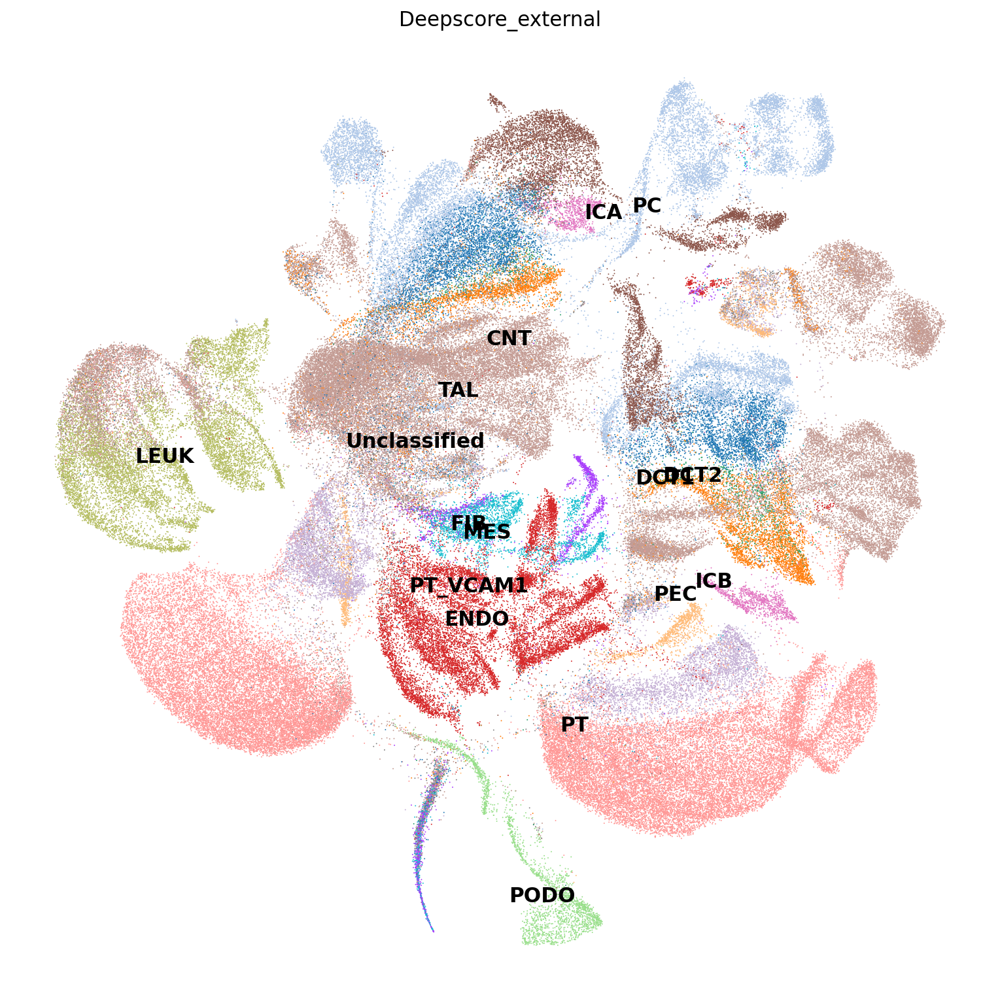

In [31]:
sc.pl.umap(adata, color = ['Deepscore_external'], legend_loc='on data', frameon = False, size = 3, palette = palette)

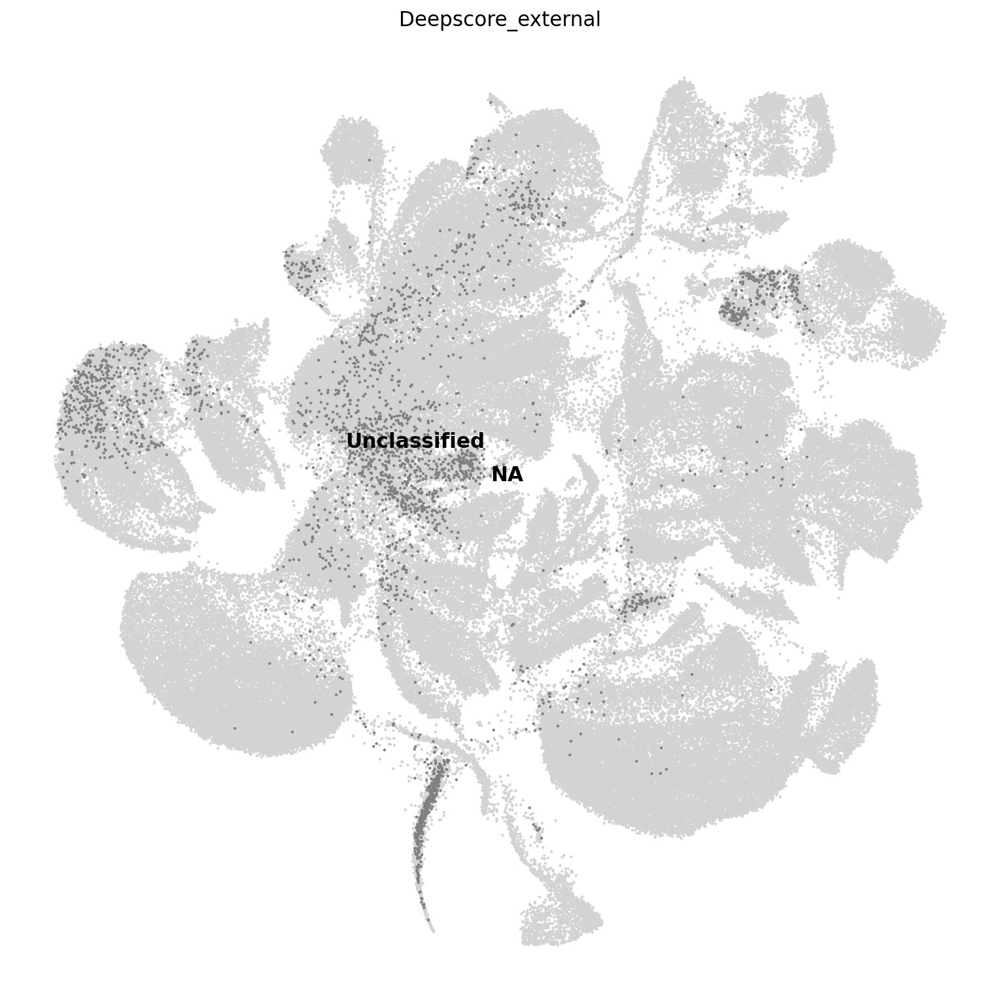

In [33]:
sc.pl.umap(adata, color = ['Deepscore_external'], legend_loc='on data', frameon = False, size = 15, groups='Unclassified')

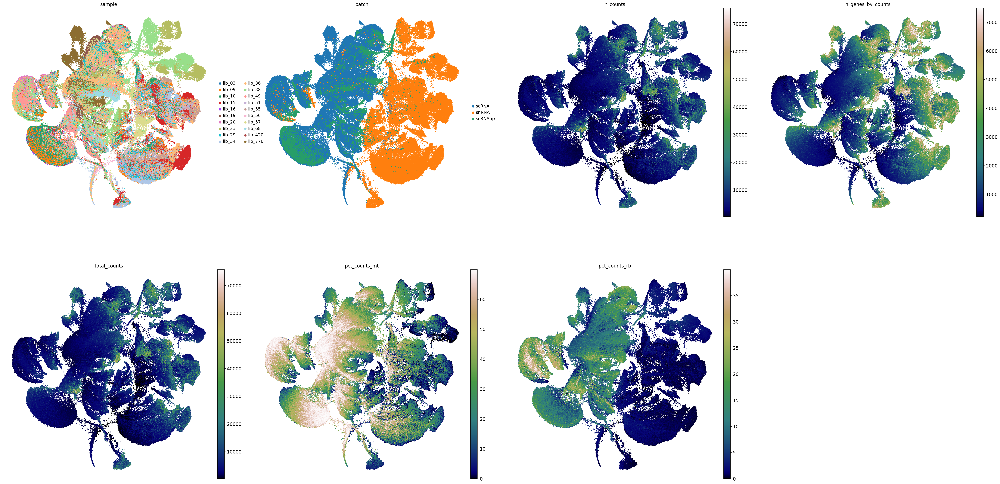

In [29]:
sc.settings.set_figure_params(figsize=('12', '12'), color_map='gist_earth')
sc.pl.umap(adata, color = ['sample', 'batch','n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb'],  frameon = False, size = 30)